# So, if:
#### Bayesian neural nets are cool, and 
### Neural net ODEs are cool, and 
## Bayesian ODEs are cool, 

# what about Bayesian Neural Net ODEs??

This work is a natural extension of the other notebooks, using UDEs within an MCMC routine.  I had started this before SciML shared their [paper](https://arxiv.org/abs/2012.07244) and tuorials for [Bayesian Neural Ordinary Differential Equations](https://diffeqflux.sciml.ai/dev/examples/BayesianNODE_NUTS/).  Its great to see the progress in this fast moving area of research!

In [1]:
cd(@__DIR__)
using Pkg; Pkg.activate("."); Pkg.instantiate()
# Import libraries.
using Turing, Flux, Plots, Random, DiffEqFlux
using StatsPlots
using LinearAlgebra
using DifferentialEquations
using DataDrivenDiffEq
using DiffEqSensitivity
using Optim
gr()


 Activating environment at `~/Dropbox/julia/universal_differential_equations/ChemicalKinetics/Project.toml`


Plots.GRBackend()

In [2]:
# We actually wont have so many params
Turing.setadbackend(:forwarddiff)

:forwarddiff

In [3]:
import Logging
Logging.disable_logging(Logging.Warn); # disable mcmc warns

In [4]:
θ₂ = [0.1]

C₀₂ = [100e-3,150e-3,0]

function model2(dc,c,p,t)
    dc[1] = -p[1]*c[1]*c[2]
    dc[2] = -p[1]*c[1]*c[2]
    dc[3] = p[1]*c[1]*c[2]
end
;

In [5]:
tspan_SD = Array{Float64,1}([10, 60, 120, 200, 400])
tspan_HD = Array{Float64,1}((1:400))

prob2_SD = ODEProblem(model2, C₀₂, (0.0,maximum(tspan_SD)), θ₂)
prob2_HD = ODEProblem(model2, C₀₂, (0.0,maximum(tspan_HD)), θ₂)

solution2_SD = solve(prob2_SD, saveat = tspan_SD, verbose = false,save_idxs = [1,2,3], save_everystep = false)
solution2_HD = solve(prob2_HD, saveat = tspan_HD, verbose = false,save_idxs = [1,2,3], save_everystep = false)

X = hcat(solution2_SD.u...)
ϵ= 0.08./2*maximum(X)
Random.seed!(123) # set seed
Xₙ = X + (ϵ)*randn(eltype(X), size(X))

3×5 Array{Float64,2}:
 0.093176   0.0513024  0.0342859  0.0152224  0.000110398
 0.147866   0.0966224  0.0785106  0.064429   0.0567588
 0.0195775  0.0475753  0.0725737  0.0791025  0.0982685

Final training loss for two network model after 410 iterations: 0.0002815613905912657


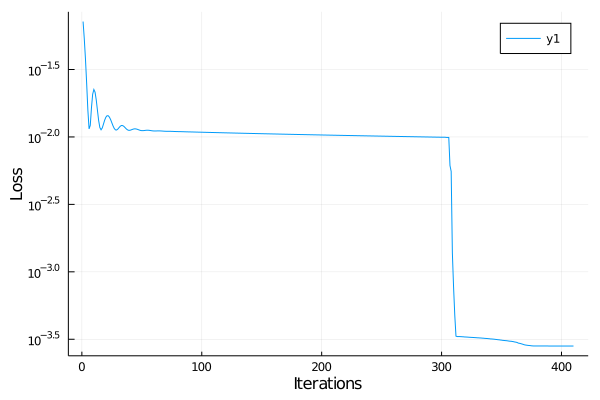

In [6]:
# Create a Basis
@variables u[1:3]
# Lots of polynomials
polys = Operation[1]

for i ∈ 1:2
    push!(polys, u[1]^i)
    push!(polys, u[2]^i)
    for j ∈ i:2
        if i != j
            push!(polys, (u[1]^j)*(u[2]^i))
            push!(polys, (u[1]^i)*(u[2]^j))
            push!(polys, u[2]^i*u[1]^i)
        end
    end
end

h = [polys...]

basis = Basis(h, u)

#const u_0 =  basis(C₀₂)
 
nrxn = 1
ncomp = 3
nbasis = length(basis.basis)
Lstoi = FastChain(FastDense(1,ncomp*nrxn,tanh)) # teeny network, independent of concentrations
ps = initial_params(Lstoi)
Lrxn = FastChain(FastDense(nbasis,nrxn,tanh), FastDense(nrxn,nrxn))
pr = initial_params(Lrxn)
L_dualexpand(u,p) = reshape(Lstoi(0.0,p[1:(ncomp*nrxn*2)]),ncomp,nrxn)*Lrxn(u,p[(ncomp*nrxn*2+1):end])

basisinputs = Lrxn.layers[1]
basisinputs_nparams =  DiffEqFlux.paramlength(Lrxn.layers[1])

function dudt_nn2x(u, p,t)
    A,B,C = u
    L_dualexpand(basis(u),p)  # make the problem easy for now
end




p = [ps;pr]
prob_nn2x = ODEProblem(dudt_nn2x,C₀₂, (0.0,maximum(tspan_SD)), p)

function predict(θ::Array{<:Real,1})
    solution2 = solve(prob_nn2x,Tsit5(),u0 = C₀₂, p=θ, saveat = tspan_SD,save_idxs=[1,2,3],
                         sensealg = InterpolatingAdjoint(autojacvec=ReverseDiffVJP()),maxiters=200)
    hcat(solution2.u...)
end

# No regularisation right now, perhaps try multi starting?
function loss(θ)
    pred = predict(θ)
    # norm(θ,1) #add L1 penalty for reactions

    sum(abs2, (Xₙ.- pred)), pred
end

losses = []

callback(θ,l,pred) = begin
    push!(losses, l)
    false
end


# First train with ADAM for better convergence
res1 = DiffEqFlux.sciml_train(loss, p, ADAM(0.001), cb=callback, maxiters = 300,save_best=true)

# Train with BFGS
res22x = DiffEqFlux.sciml_train(loss, res1.minimizer, BFGS(initial_stepnorm=0.01), cb=callback, maxiters = 300)

println("Final training loss for two network model after $(length(losses)) iterations: $(losses[end])")



# Plot the losses
plot(losses, yaxis = :log, xlabel = "Iterations", ylabel = "Loss")

In [7]:
popt = res22x.minimizer
numerical_hessian = Optim.hessian!(Optim.TwiceDifferentiable(p -> sum(abs2, (Xₙ.- predict(p))),popt; autodiff=:forward),popt);

In [8]:
# invert hessian for cov matrix
var_cov_matrix = pinv(numerical_hessian)
var_cov_matrix ;

In [9]:
# set diag 0s to 1
var_cov_matrix[diagind(var_cov_matrix)[diag(var_cov_matrix.==0)]] .= 1.0;
var_cov_matrix;

Ok, we have the best fit, run MCMC around the optimum.  This cov matrix is not Hermetian and will not work with MCMC, must find a way to include this in the future.

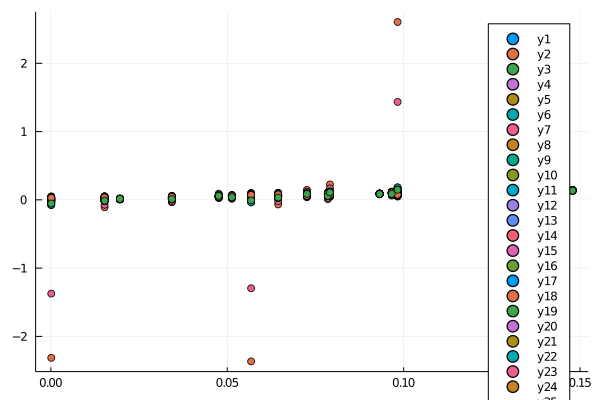

In [11]:
θ = MvNormal(popt, 0.03*abs.(popt))
plt = scatter(vec(Xₙ),vec(predict(popt)))
for i = 1:50
    scatter!(vec(Xₙ),vec(predict(vec(rand(θ,1)))))
end
display(plt)

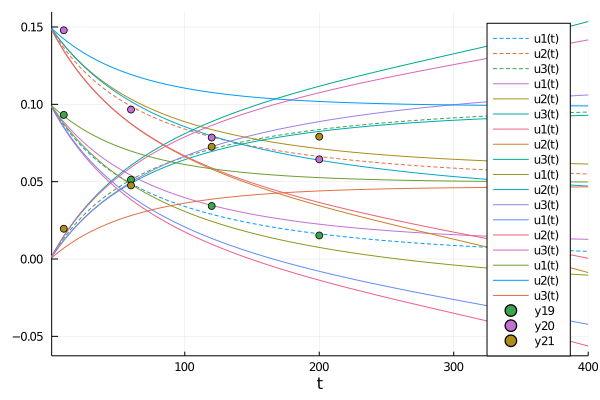

In [12]:
# see what the priors do:
plot(solution2_HD,line=:dash)

for i = 1:5
    solution = solve(prob_nn2x,u0 = C₀₂, p=rand(θ,1), saveat = tspan_HD,save_idxs=[1,2,3],
                             sensealg = InterpolatingAdjoint(autojacvec=ReverseDiffVJP(true)), maxiters=200)
    plot!(solution)
end
scatter!(tspan_SD,Xₙ')



The priors appear to be sufficiently broad, let's go `NUTS`!

In [13]:
sig = 0.03
popt = res22x.minimizer
num_params = length(popt)
println(num_params)
@model function fitm2_nn(data::Array{<:Real,1})
    
    θ ~ MvNormal(popt, abs.(popt)*sig)
    σ ~ InverseGamma(20, 0.1)

    predicted = vec(predict(vec(θ)))
    data[1:length(predicted)] ~ MvNormal(predicted,σ)
end
model = fitm2_nn(vec(Xₙ)) 

17


DynamicPPL.Model{var"#5#6",(:data,),(),(),Tuple{Array{Float64,1}},Tuple{}}(:fitm2_nn, var"#5#6"(), (data = [0.09317601708575178, 0.14786601868980503, 0.019577499647048358, 0.05130242452371168, 0.09662235672491745, 0.047575265611258175, 0.03428593586786836, 0.07851056801687306, 0.0725736679135039, 0.01522239384438248, 0.06442896430230834, 0.07910252010436804, 0.00011039836957836991, 0.05675880740087851, 0.09826852837205444],), NamedTuple())

Run the chains, some experimentation with samplers indicates that HMC(0.05,4) has problems, MH() works but is inefficient,  NUTS(0.65) works, but NUTS(1000,0.65) does not.  Use NUTS(0.5) to run out the model.  Forwarddiff seems to be ~10x faster than zygote (430 secs/chain/1000 samples)

In [14]:
chain = sample(model,NUTS(.5),MCMCThreads(), 1000, 4,progress=true)  # 


Chains MCMC chain (500×30×4 Array{Float64,3}):

Iterations        = 1:500
Thinning interval = 1
Chains            = 1, 2, 3, 4
Samples per chain = 500
parameters        = θ[1], θ[2], θ[3], θ[4], θ[5], θ[6], θ[7], θ[8], θ[9], θ[10], θ[11], θ[12], θ[13], θ[14], θ[15], θ[16], θ[17], σ
internals         = acceptance_rate, hamiltonian_energy, hamiltonian_energy_error, is_accept, log_density, lp, max_hamiltonian_energy_error, n_steps, nom_step_size, numerical_error, step_size, tree_depth

Summary Statistics
  parameters      mean       std   naive_se      mcse         ess      rhat 
      Symbol   Float64   Float64    Float64   Float64     Float64   Float64 

        θ[1]    0.5593    0.0171     0.0004    0.0003   2115.7728    0.9993
        θ[2]    0.9639    0.0290     0.0006    0.0008   2209.9934    0.9991
        θ[3]    0.0128    0.0004     0.0000    0.0000   1979.0717    1.0011
        θ[4]    0.0054    0.0001     0.0000    0.0000   1926.8014    0.9997
        θ[5]    0.0054    0.0001  

Diagnostics and sampling looks good:

In [15]:
val = group(chain,:θ)
gelmandiag(chain)

Gelman, Rubin, and Brooks Diagnostic
  parameters      psrf     97.5% 
      Symbol   Float64   Float64 

        θ[1]    1.0012    1.0035
        θ[2]    1.0007    1.0033
        θ[3]    1.0024    1.0043
        θ[4]    1.0001    1.0016
        θ[5]    1.0004    1.0025
        θ[6]    1.0002    1.0015
        θ[7]    1.0035    1.0106
        θ[8]    1.0012    1.0014
        θ[9]    1.0017    1.0029
       θ[10]    1.0018    1.0040
       θ[11]    1.0019    1.0052
       θ[12]    1.0007    1.0032
       θ[13]    1.0018    1.0042
       θ[14]    0.9992    0.9994
       θ[15]    1.0022    1.0084
       θ[16]    1.0041    1.0086
       θ[17]    1.0030    1.0062
           σ    1.0016    1.0069


In [16]:
plot(chain)

In [17]:
# see what the NUTS posterior does:
plot(solution2_HD,line=:dash)

for i = 1:100
    solution = solve(prob_nn2x,u0 = C₀₂, p=val.value.data[i,:,1], saveat = tspan_HD,save_idxs=[1,2,3],
                             sensealg = InterpolatingAdjoint(autojacvec=ReverseDiffVJP(true)), maxiters=200)
    plot!(solution,color=:gray,alpha=0.08)
end
scatter!(tspan_SD,Xₙ')

# Try ADVI

In [18]:
@model function fitm2_nn(data::Array{<:Real,1})
    
    θ ~ MvNormal(popt, sig.*abs.(popt))
    σ ~ InverseGamma(20, 0.1)
    predicted = vec(predict(vec(θ)))
    data[1:length(predicted)] ~ MvNormal(predicted,σ)
end
model = fitm2_nn(vec(Xₙ)) 

advi = ADVI(100, 1000)
q = vi(model, advi);

[ADVI] Optimizing...100% Time: 0:14:22


In [19]:
samps= rand(q,50);

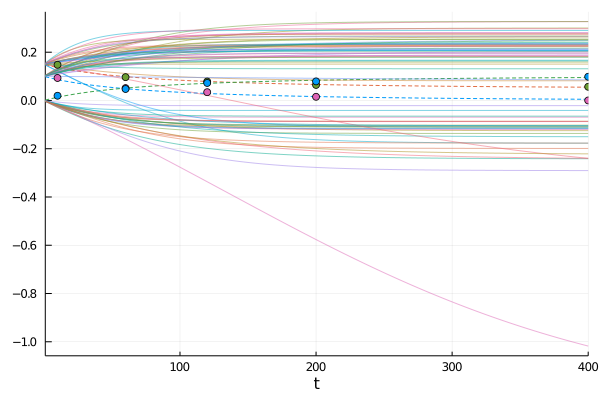

In [20]:
# see what the ADVI posterior does:
plot(solution2_HD,line=:dash)

for i = 1:25
    solution = solve(prob_nn2x,u0 = C₀₂, p=samps[1:17,i], saveat = tspan_HD,save_idxs=[1,2,3],
                             sensealg = InterpolatingAdjoint(autojacvec=ReverseDiffVJP(true)), maxiters=200)
    plot!(solution,alpha=0.5,legend=:none)
end
scatter!(tspan_SD,Xₙ')

ADVI is fast, but not effective in this case

# Next task: recovery of the true model
Ok, so we can run MCMC on the NNODE, now can we use the fit to recover the true model?  First start by recovering the NN submodels:

In [21]:
# see what the NUTS posterior does:
plot(solution2_HD,line=:dash)
stois = Array{Array{Float64,2}}([])
r = Array{Array{Float64,2}}([])
samp_ix = Array{Array{Float64,1}}([])
Xs = Array{Array{Float64,2}}([])
for i = 1:500
    p = val.value.data[i,:,1]
    solution = solve(prob_nn2x,u0 = C₀₂, p=p, saveat = tspan_HD,save_idxs=[1,2,3],
                             sensealg = InterpolatingAdjoint(autojacvec=ReverseDiffVJP(true)), maxiters=200)
    push!(stois,Lstoi(0.0,p[1:(ncomp*nrxn*2)]))
    
    X = Array(solution)
    push!(Xs,X)
    push!(r,Lrxn(basis(X),p[(ncomp*nrxn*2+1):end]))
    push!(samp_ix,ones(length(tspan_HD))*i)
end

In [22]:
plot(vcat(r...)')
DX_true = Array(solution2_HD(tspan_HD,Val{1}))[3,:]
plot!(-DX_true*200,line=:dash,color=:magenta,legend=:none)

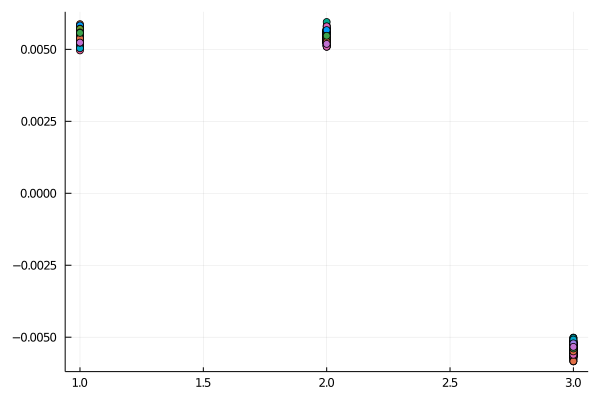

In [23]:
scatter(hcat(stois...),legend=:none)

With the method, all of the samples seem to be fairly tight.  Stoichiometry model doesnt jump between equivalent values, perhaps the priors are too tight there.

# Feature selection
Identifying the best model is fundamentally a feature selection task to see what combination of basis functions describes the data best, there are some options:

 - SINDy
 - Stepwise regression
 - Brouda
 - Projpred
 - Lasso
 
 
 SINDy was the UDE approach used previously, unsucessfuly for the kinetic models. Stepwise regression is sucky and horrible, Projpred and Brouda dont appear have Julia implementations, so look at Lasso first

In [24]:

XX = cat(Xs...,dims=2)
YY = cat(r...,dims=2)

1×200000 Array{Float64,2}:
 -0.238462  -0.233603  -0.228885  -0.224301  …  -0.00695065  -0.00691178

In [25]:
p = popt
Lstoi(0.0,p[1:(ncomp*nrxn*2)])

3×1 Array{Float64,2}:
  0.005439504882726195
  0.00544218002762774
 -0.0054281719529485845

Test SINDy to understand the optimization this doesnt look promising.

In [26]:
λ = exp10.(-7:0.1:3)
opt = STRRidge()
Ψ=SINDy(XX, YY, basis,λ,opt, maxiter = 100, normalize = true,denoise=true,convergence_error=1)
print_equations(Ψ)


1 dimensional basis in ["u₁", "u₂", "u₃"]
f_1 = p₁ + u₁ ^ 2 * p₆ + u₂ ^ 2 * p₇ + p₂ * u₁ + p₃ * u₂ + u₂ ^ 2 * p₄ * u₁ + p₅ * u₁ * u₂



use GLMNet Lasso model with cross validation.  For cross validation folds, split along simulation timepoints binned into 8 groups:

In [27]:
folds =Array{Int64,1}([])
for i= 1:8
    append!(folds,ones(Int64,Int64(length(tspan_HD)/8))*i)
end

In [28]:
using GLMNet  # Lasso.jl has some Pkg compatibility problems
XX = cat(Xs...,dims=2)
YY = cat(r...,dims=2)
path = glmnetcv(basis(XX)[2:end,:]', vec(YY),lambda=exp.(collect(-10:1)),folds=repeat(folds,length(r)))
βs =path.path.betas;
λs= path.lambda;

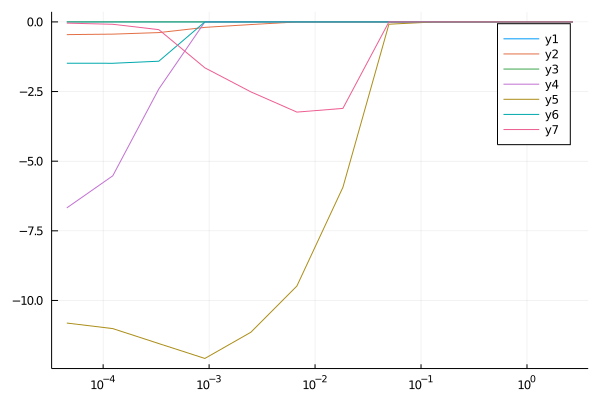

In [29]:
plot(λs,βs',xaxis=:log)

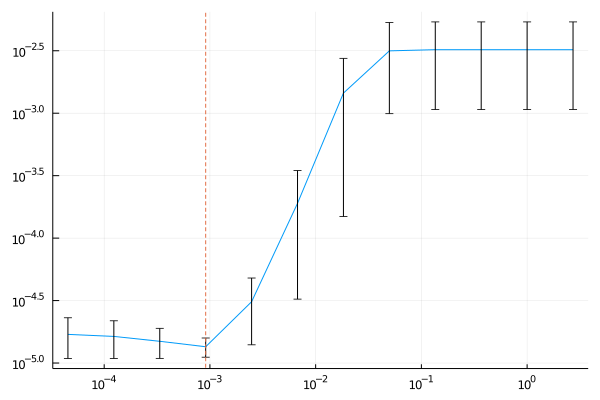

In [30]:
plot(path.lambda, path.meanloss, xscale=:log10, yscale=:log10, legend=false, yerror=path.stdloss)
vline!([lambdamin(path)],line=:dash)

Look at weights for best value of $\lambda$: 

In [31]:
hcat(vec([path.path.a0[argmin(path.meanloss)],βs[:,argmin(path.meanloss)]...]),basis.basis)

8×2 Array{Expression,2}:
 Constant(0.00998342)  Constant(1)
        Constant(0.0)           u₁
   Constant(-0.19567)           u₂
        Constant(0.0)  u₁ ^ 2 * u₂
        Constant(0.0)  u₂ ^ 2 * u₁
   Constant(-12.0818)      u₁ * u₂
        Constant(0.0)       u₁ ^ 2
   Constant(-1.64881)       u₂ ^ 2

Nice!  The correct term has the biggest weight.  This is promising.

# Conclusion
In this case the MCMC was a bit overkill as it did not explore new areas of the parameter space, but still better than ADVI which is not well suited to this problem.  The results from Lasso feature selection were much better than SINDy using the default settings.  

Some areas of improvement:  
 - Include the optimization covariance matrix in the MCMC calculation, and implement some of the other feature selection algorithms.  
 - This was a pretty simple kinetic model that was explored here, worthwhile to test some of the more complicated ones.  
 - Also tinker with SINDy under the hood to yield a ranked list, perhaps score these with AICc?  
 - Include the estimate of obervation error in the Lasso feature selection, somehow.
 - Test the NNODE fit to the data by mis-specifying the number of components and reactions

# Appendix: Pkg.status()

In [32]:
versioninfo()

Julia Version 1.5.2
Commit 539f3ce943 (2020-09-23 23:17 UTC)
Platform Info:
  OS: Linux (x86_64-pc-linux-gnu)
  CPU: Intel(R) Core(TM) i3-4130 CPU @ 3.40GHz
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-9.0.1 (ORCJIT, haswell)
Environment:
  JULIA_CMDSTAN_HOME = /home/jak/cmdstan-2.24.1
  JULIA_NUM_THREADS = 4


In [33]:
]status

Status `~/Dropbox/julia/universal_differential_equations/ChemicalKinetics/Project.toml`
  [6e4b80f9] BenchmarkTools v0.5.0
  [336ed68f] CSV v0.8.2
  [479239e8] Catalyst v5.1.0
  [717857b8] DSP v0.6.10
  [2445eb08] DataDrivenDiffEq v0.4.1 `https://github.com/SciML/DataDrivenDiffEq.jl#master`
  [a93c6f00] DataFrames v0.21.8
  [2b5f629d] DiffEqBase v6.48.2
  [ebbdde9d] DiffEqBayes v2.17.0
  [aae7a2af] DiffEqFlux v1.24.0
  [41bf760c] DiffEqSensitivity v6.33.0
  [0c46a032] DifferentialEquations v6.15.0
  [31c24e10] Distributions v0.23.12
  [6a86dc24] FiniteDiff v2.7.2
  [26cc04aa] FiniteDifferences v0.10.9
  [587475ba] Flux v0.11.1
  [f6369f11] ForwardDiff v0.10.14
  [8d5ece8b] GLMNet v0.6.1
  [7073ff75] IJulia v1.23.0
  [a98d9a8b] Interpolations v0.12.10
  [5ab0869b] KernelDensity v0.6.2
  [23992714] MAT v0.8.1
  [429524aa] Optim v1.2.0
  [1dea7af3] OrdinaryDiffEq v5.44.0
  [91a5bcdd] Plots v1.7.3
  [d330b81b] PyPlot v2.9.0
  [c6596682] QuantileRegressions v0.1.6
  [276daf66] SpecialFuncti